# Примеры использования классических методов обработки изображений в компьютерном зрении


**Импорт библиотеки OpenCV**

Библиотека `OpenCV` — это бесплатная библиотека методов решения задач обработки зображений и компьютерного зрения. Библиотека широко распространена и содержит, возможно, порядка половины всех известных методов (по крайней мере, классических) для решения соответствующих задач.



In [ ]:
import cv2

Также импортируем вспомогательные пакеты.

In [ ]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams.update({'font.size': 17})

import urllib.request
from PIL import Image

Первое, что нам нужно, это открыть изображение.

Для получения изображения загрузим его с внешнего рессурса при помощи метода urlretrieve из модуля `urllib.request`.


In [ ]:
image_url = 'https://github.com/MVRonkin/for_course_DLCV/blob/main/image.png?raw=true'
urllib.request.urlretrieve(image_url,"image.png");

In [ ]:
image = cv2.imread("image.png")

Каждое изображение, полученное в формате `OpenCV` имеет формат $\text{height}\times \text{width} \times \text{channels}$. Последний также может называться глубиной изображения ($\text{depth}$).

>Обратите внимание, что в некоторых других фреймворках, например, `PIL` формат будет $\text{width}\times \text{height}$ (для метода `size` наоборт).

In [ ]:
(h, w, d) = image.shape
print(f"height={h}, width={w}, depth={d}")


height=823, width=1280, depth=3


Для классической среды `Jupyter` лучше отрисовывать изображения из `OpenCV` с помощью библиотеки ` matplotlib` (методы  `plt`). Однако первое, что нам нужно сделать при работе с открытыми изображениями `cv` вне библиотеки - это преобразовать формат изображения. Дело в том, что `OpenCV` работает с изображением в формате `BGR` (Blue, Green, Red) (обратном к классическому формату `RGB`). Для преобразования форматов используем функцию `cvtColor`.

Для отрисовки изображений создадим отдельную функцию `axplot`. В этом уроке она нам понадобиться много раз.

In [ ]:
def axplot(image, ax=None, title='', standardize = False, **kwargs):
    ''' kwargs: figsize:(int,int); rows_cols:(int,int); finish:bool; ret_ax:bool'''
    image_ = image

    if standardize:
        image_ = np.copy(image).astype(float)
        image_ = 255*(image_ - image_.min())/(image_.max()-image_.min())
        image_ = image_.astype(np.uint8)

    if ax is None:
        figsize   = (6,4) if kwargs.get('figsize')   is None else kwargs.get('figsize')
        rows_cols = (1,1) if kwargs.get('rows_cols') is None else kwargs.get('rows_cols')
        fig,ax  = plt.subplots(*rows_cols, figsize=figsize)

    ax_ = ax.ravel()[0] if type(ax) in [np.ndarray,list] else ax
    ax_.imshow(image_, cmap='gray'); ax_.axis('off'); ax_.set_title(title)

    if kwargs.get('finish'): plt.tight_layout(); plt.show();
    if kwargs.get('ret_ax'): return ax
#-------------------------------------------------------------
def axplots(list_images, list_titles='',figsize=None,rows_cols=None):
    n_images = len(list_images)

    if rows_cols is None:
        rows_cols = (int(np.ceil(n_images/3)),min(3,n_images))

    if figsize is None:
        figsize = (4*rows_cols[1],4*rows_cols[0])

    fig,axs = plt.subplots(*rows_cols,figsize=figsize)

    if not isinstance(list_titles,list):
        list_titles=list(list_titles)

    if len(list_titles) <n_images:
        list_titles+=(n_images - len(list_titles))*['']

    axs = axs.ravel()
    for i,(image,title) in enumerate(zip(list_images,list_titles)):
        axplot(image, ax=axs[i], title=title)

    plt.tight_layout(); plt.show();

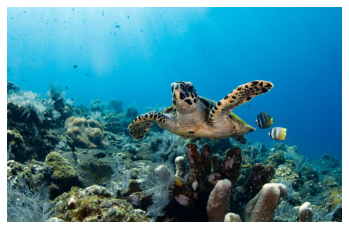

In [ ]:
image = cv2.imread("image.png", )
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
axplot(image);

В рамках библиотеки `OpenCV` возможны не только RGB/BGR форматы изображния, но также и некоторые другие. Посмотрим примеры представленя одного и тогоже изображения в разных форматах.

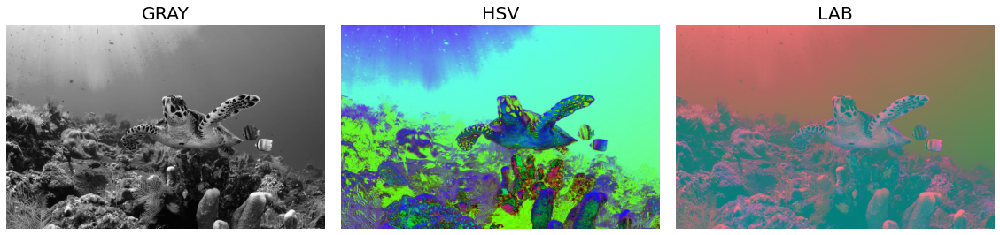

In [ ]:
image = cv2.imread("image.png")

# GRAY SCALE
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# HSV FORMAT
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
# LAB FORMAT
lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

axplots([gray,hsv,lab], ['GRAY','HSV','LAB'], figsize=(16,4) )


Изображение, полученное методами `OpenCV` совместимы с форматом `ndarray` (пакет  `Numpy`). Поэтому  вы можете рассматривать изображения как тензор или набор матриц типа.
Посмотрим на некоторые операции, которые мы можем сделать с изображением при помощи средств `Numpy`.

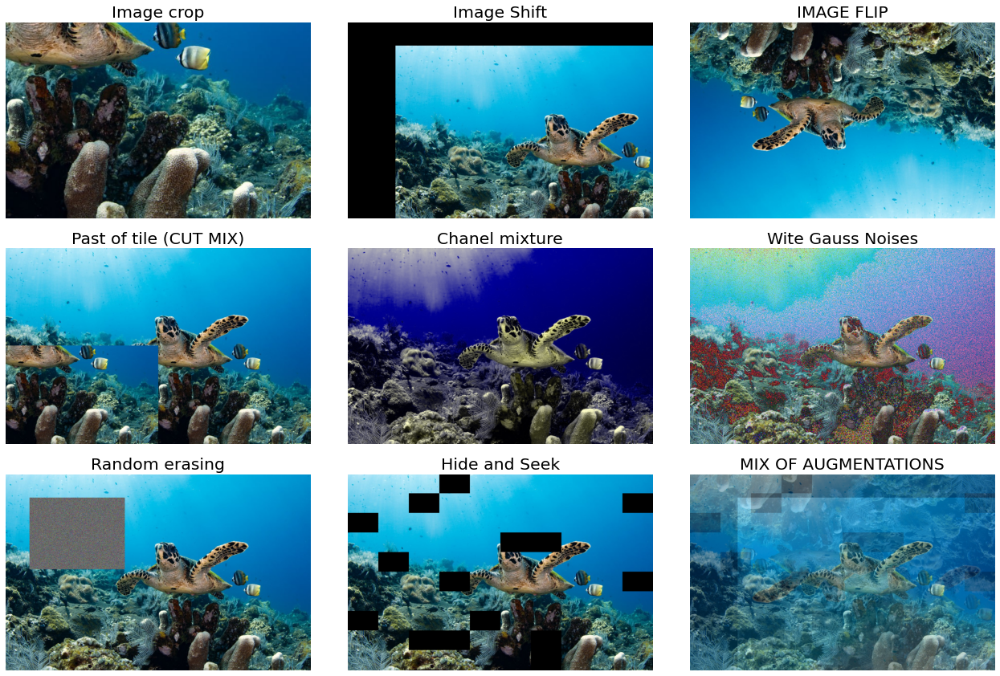

In [ ]:
image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig,axs = plt.subplots(3,3,figsize=(18,12))

w,h = image.shape[0],image.shape[1]

#1. CROP = CUT
cut = image[w//2:,h//2:,:]
axplot(cut, axs[0,0], 'Image crop')

#2. IMAGE SHIFT
image_shift = np. copy(image)
image_shift[100:,200:,:] = image[:-100,:-200,:]
image_shift[:100,:,:] = 0
image_shift[:,:200,:] = 0
axplot(image_shift, axs[0,1], 'Image Shift')

#3. IMAGE FLIP
flip = np.copy(image)[::-1,::-1,:]
axplot(flip, axs[0,2], 'IMAGE FLIP' )

#4. PAST TAIL INTO IMAGE
past = np.copy(image)
past[w//2:,:h//2,:] = cut
axplot(past, axs[1,0], 'Past of tile (CUT MIX)' )

#5. CHANNEL MIXTURE
chanel_mixture = np. copy(image)
chanel_mixture[:,:,2],chanel_mixture[:,:,1] = 0.8*chanel_mixture[:,:,1],chanel_mixture[:,:,0]
axplot(chanel_mixture, axs[1,1], 'Chanel mixture' )

#6. ADD NOISES
var  = 300
gauss_noise = np.random.normal(0,np.sqrt(var),image.shape).astype('uint8')
gauss = image + gauss_noise
axplot(gauss, axs[1,2], 'Wite Gauss Noises' , True)

#7. RANDOM ERASING
image_erase  = np.copy(image)
mean, var = np.mean(image), 1000
w_erase, h_erase = 300,400
gauss_noise  = np.random.normal(mean,np.sqrt(var),(w_erase,h_erase,image.shape[2])).astype('uint8')
image_erase[100:w_erase+100,100:h_erase+100,:] = gauss_noise
axplot(image_erase, axs[2,0], 'Random erasing' , True)

#8. HIDE AND SEEK OF IMAGE
scale_pathe,n_hides  = 10, 20
hs_ = np.copy(image)
w_path, h_path = w//scale_pathe, h//scale_pathe
w_hides = np.random.choice(np.arange(0, w, w_path),size = n_hides)
h_hides = np.random.choice(np.arange(0, h, h_path),size = n_hides)
for w_, h_ in zip(w_hides, h_hides):
    hs_[w_:w_+w_path,h_:h_+h_path,:] = 0
axplot(hs_, axs[2,1], 'Hide and Seek' , True)


#9. MIX OF AUGMENTATIONS
image_ = np.copy(image).astype(float)
#weights
w = np.asarray([3,2,1.8,3,2.2])
w /= w.sum()
image_ = (image*w[0] + hs_*w[1] + chanel_mixture *w[2] + flip *w[3] + image_shift*w[4])
axplot(image_, axs[2,2], 'MIX OF AUGMENTATIONS' , True, finish=True )


Библиотека `OpenCV` имеет большое количество собственных методов для преобразования изображений. Посмотрим на некоторые из них.

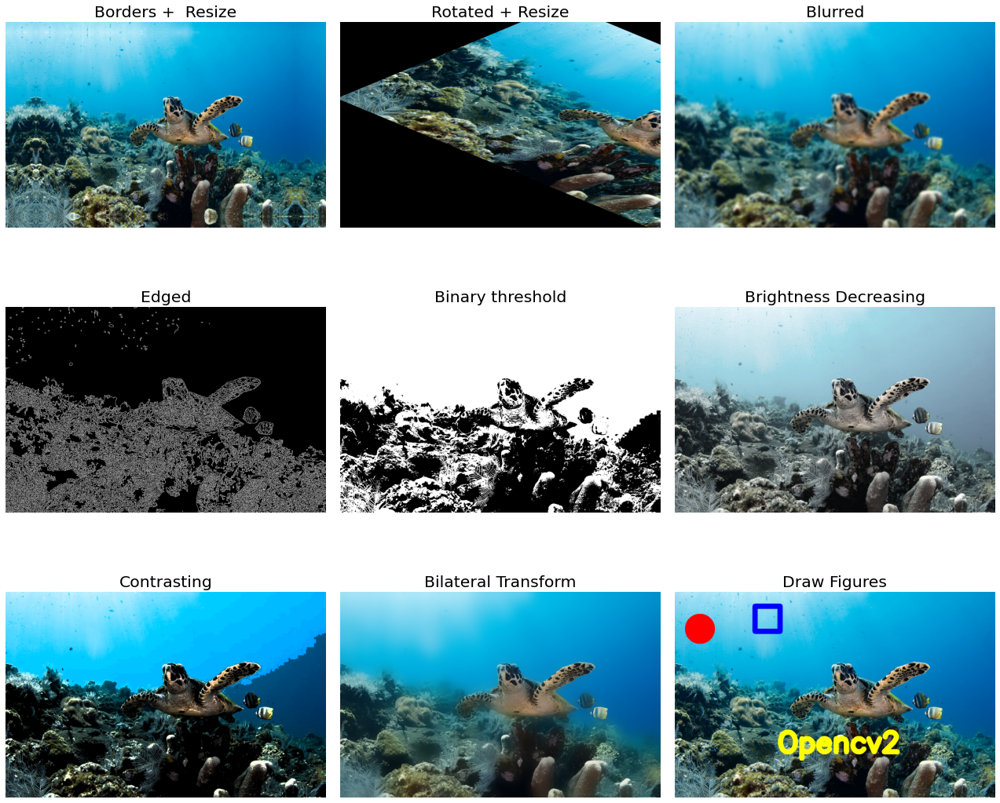

In [ ]:
image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(3,3, figsize=(18,16))

w = image.shape[0]
h = image.shape[1]
center = (w // 2, h // 2)

# 1. MAKE BORDERS AND REZIE THE IMAGE
top, bottom, left, right = 50,50,150,150
reflect = cv2.copyMakeBorder(image, top, bottom, left, right, cv2.BORDER_REFLECT)
axplot(cv2.resize(reflect,(h,w)), axs[0,0], 'Borders +  Resize' )

# 2. ROTATE AND RESIZE THE IMAGE
M = cv2.getRotationMatrix2D(center, -45, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
axplot(cv2.resize(rotated,(h,w)), axs[0,1], 'Rotated + Resize' )

# 3. BLURRE THE IMAGE
blurred = cv2.GaussianBlur(image, (21, 21), 0)
axplot(blurred, axs[0,2], 'Blurred' )

# 4. SEARCH EDGES IN THE IMAGE
edged = cv2.Canny(image, 30, 150)
axplot(edged, axs[1,0], 'Edged' )

# 5. BINARIZING THE IMAGE
_,threshold = cv2.threshold(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), 100, 255, cv2.THRESH_BINARY)
axplot(threshold, axs[1,1], 'Binary threshold' )

# 6. BRIGHTNESS CHANGES OF THE IMAGE
values = (1,0.3,1)
hsv  = cv2.cvtColor(image, cv2.COLOR_RGB2HSV).astype(float)
hsv *= values
rgb_ = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
# bright  = cv2.convertScaleAbs(image, beta=70)
axplot(rgb_, axs[1,2], 'Brightness Decreasing', True )

# 7. CONTRAST THE IMAGE
contrast = 60
im_ = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
im_[:,:,2] = [[max(pixel - contrast, 0)
                 if pixel < 190 else min(pixel + contrast, 255) for pixel in row]
                 for row in im_[:,:,2]]
im_= cv2.cvtColor(im_, cv2.COLOR_HSV2BGR)
axplot(im_, axs[2,0], 'Contrasting' )

# 8. BILATERAL  TRANSFORMATION OF THE IMAGE
d, sigmaColor, sigmaSpace = 75,125,125
im = cv2.bilateralFilter(image, d,sigmaColor,sigmaSpace)
axplot(im, axs[2,1], 'Bilateral Transform' )

# 9. DRAW FIGURES IN THE IMAGE
draw_figures = image.copy()
cv2.rectangle(draw_figures, (320, 60), (420, 160), (0, 0, 255), 20)
cv2.circle(draw_figures, (100, 150), 60, (255, 0, 0), -1)
cv2.putText(draw_figures, "Opencv2 ", center, cv2.FONT_HERSHEY_SIMPLEX, 3.7, (255, 255, 0), 20)
axplot(draw_figures, axs[2,2], 'Draw Figures', finish=True )


Также отдельно посмотрим на работу методов адаптивного порога для изображений.

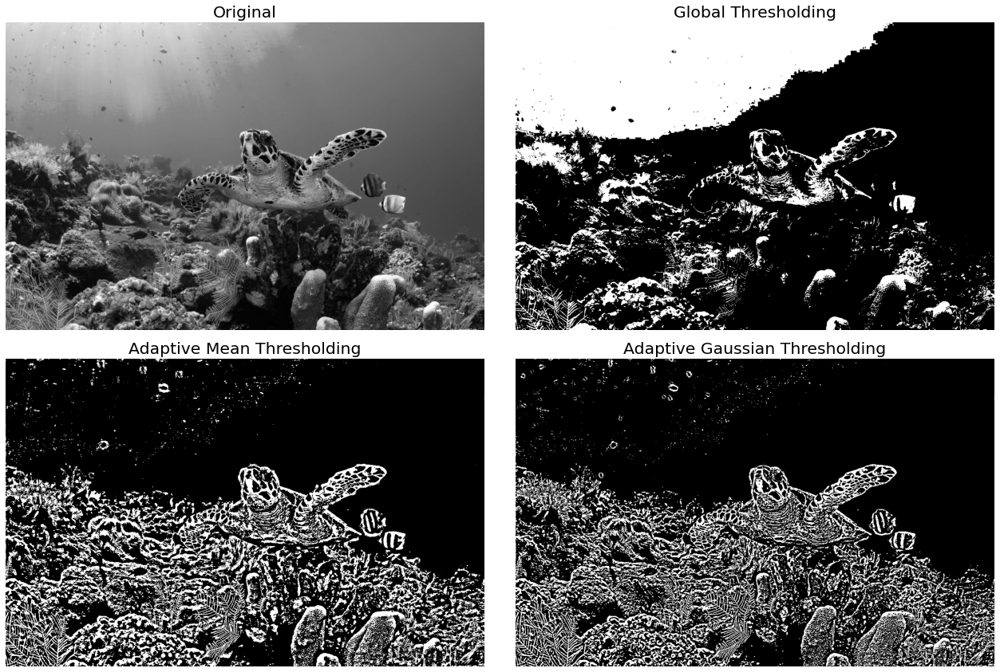

In [ ]:
image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

ret,th1 = cv2.threshold(image,127,255,cv2.THRESH_BINARY)

th2 = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,21,-5)

th3 = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,21,-5)


_,axs = plt.subplots(2,2, figsize=(18,12))
axplot(image,axs[0,0],'Original')
axplot(th1,axs[0,1],'Global Thresholding')
axplot(th2,axs[1,0],'Adaptive Mean Thresholding')
axplot(th3,axs[1,1],'Adaptive Gaussian Thresholding', finish=True)

Также библиотека `OpenCV` позволяет реализовывать и многие другие операции низкоуровневой обработки изображений, например, складывать несколько изображений. Посмотрим, как это может быть реализовано c помощью метода `addWeighted`. А также метод `resize` для выравнивания размеров изображений

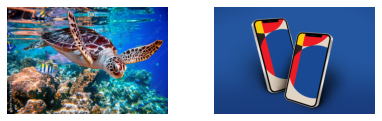

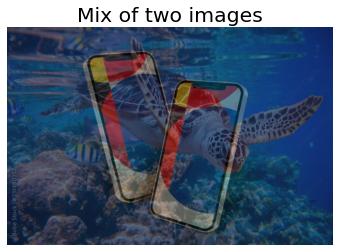

In [ ]:
image1_url = 'https://as2.ftcdn.net/v2/jpg/02/31/48/03/1000_F_231480357_TGpMz4r5HSFAlm43FkZ366FjFZuuoRA8.jpg'
urllib.request.urlretrieve(image1_url,"image1.png")
image1 = cv2.imread("image1.png",cv2.IMREAD_COLOR)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)


image2_url = 'https://as2.ftcdn.net/jpg/04/46/10/77/1024W_F_446107734_NaiNx4Qxq1bT4ipU1vGohw1dtU9kOWpx_NW1.jpg'
urllib.request.urlretrieve(image2_url,"image2.png")
image2 = cv2.imread("image2.png",cv2.IMREAD_COLOR)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

image2 = cv2.resize(image2, image1.shape[:2][::-1])

fig,axs = plt.subplots(1,2, figsize=(6,2))
axplot(image1,axs[0]); axplot(image2,axs[1], finish=True )

mix = cv2.addWeighted(image1,0.3,image2,0.4,0)
axplot(mix,title='Mix of two images');


Важными операциями, которые могут быть также реализованы в `OpenCV` являются операции эквивализации гистограммы изображений. Такая эквавализация может быть как по всему изображению (глобальной, `equalizeHist`), так и по отдельным частям изображения (то есть в скользящем окнеб локальная, `Contrast Limited Adaptive Histogram Equalization` (`CLAHE`)).

Посмотрим на результат работ методов эквивализации для изображения в шкале серого. Для каждого изображения посмотрим на его гистограмму и кумулятивную функцию распределения (кумулятивную сумму гистограммы, `CDF`).

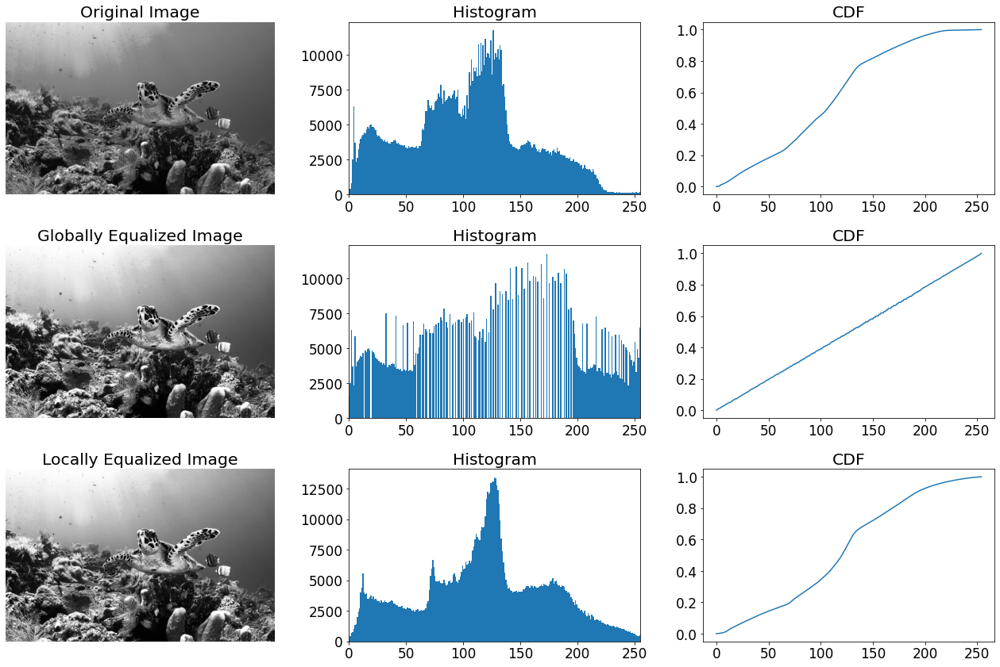

In [ ]:
img = cv2.imread("image.png",cv2.IMREAD_GRAYSCALE )

# GLOBAL EUQALIZING
equ = cv2.equalizeHist(img)

# LOCAL EUQALIZING
clahe = cv2.createCLAHE(clipLimit = 2.0,tileGridSize = (16,16))
clahed = clahe.apply(img)

fig,axs = plt.subplots(3,3,figsize=(18,12))

#ORIGINAL IMAGE
axplot(img, axs[0,0], 'Original Image' )
b, bins, patches = axs[0,1].hist(img.flatten(), 255)
axs[0,1].set_xlim([0,255]); axs[0,1].set_title('Histogram')
axs[0,2].plot(np.cumsum(b)/np.sum(b)); axs[0,2].set_title('CDF')

#GLOBALLY EQUALIZED IMAGE
axplot(equ, axs[1,0], 'Globally Equalized Image' )
b, bins, patches = axs[1,1].hist(equ.flatten(), 255)
axs[1,1].set_xlim([0,255]); axs[1,1].set_title('Histogram')
axs[1,2].plot(np.cumsum(b)/np.sum(b)); axs[1,2].set_title('CDF')

#LOCALLY EQUALIZED IMAGE
axplot(equ, axs[2,0], 'Locally Equalized Image' )
b, bins, patches = axs[2,1].hist(clahed.flatten(), 255)
axs[2,1].set_xlim([0,255]); axs[2,1].set_title('Histogram')
axs[2,2].plot(np.cumsum(b)/np.sum(b)); axs[2,2].set_title('CDF')

plt.tight_layout()
plt.show()

Библиотека  `OpenCV` позволяет фильтровать изображения. В данном случае речь идет о классической фильтрации. Такая фильртация может быть выполнеа как с произвольным ядром фильтра, так и с заданными ядрами. Для начала посмотрим на то, как работать с произвольным ядром фильтра.

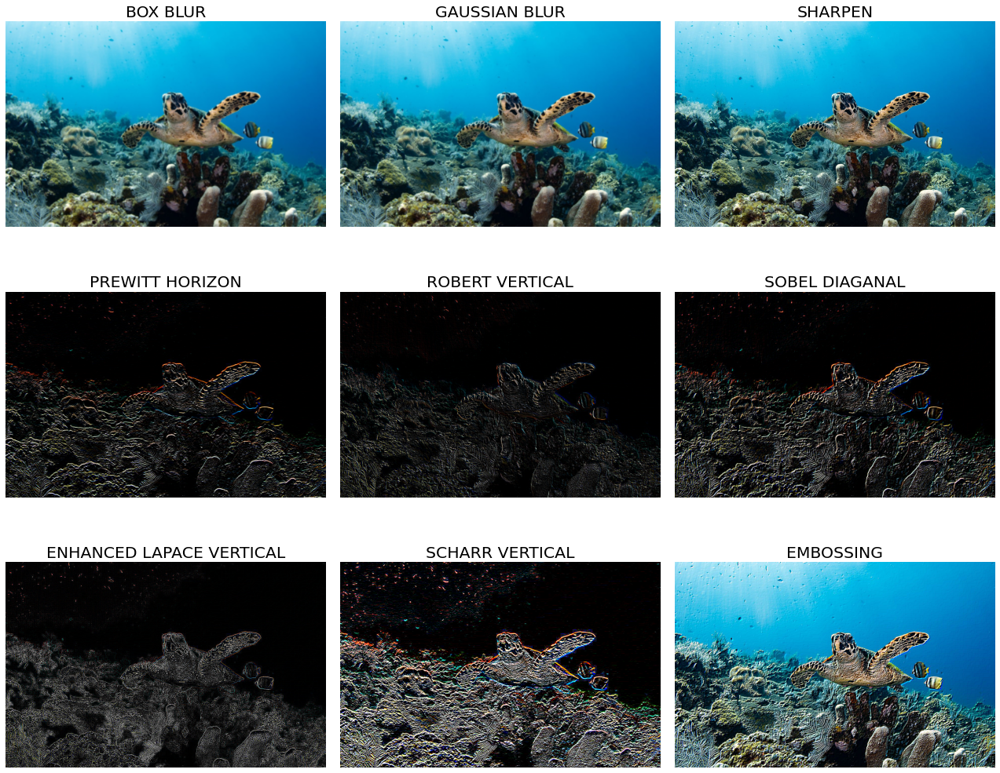

In [ ]:
image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(3,3, figsize=(18,15))

#1. BOX BLURRING
kernel = np.ones(25).reshape(-1,5)
kernel = np.asarray(kernel)/np.sum(np.abs(kernel))
boxblur  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(boxblur, axs[0,0], 'BOX BLUR' )

#2. GAUSSIAN BLURRING
kernel = [[2, 4,   5,  4, 2],
          [4, 9,  12,  9, 4],
          [5, 12, 15, 12, 5],
          [4, 9,  12,  9, 4],
          [2, 4,   5,  4, 2]]
kernel = np.asarray(kernel)/np.sum(np.abs(kernel))
gaussian_blure  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(gaussian_blure, axs[0,1], 'GAUSSIAN BLUR' )

#3. SHARPEN FILTER
kernel = np.array([[1, 4,     6,  4, 1],
                   [4, 16,   24, 16, 4],
                   [6, 24, -476, 24, 6],
                   [4, 16,   24, 16, 4],
                   [1, 4,     6,  4, 1]])
kernel   = np.asarray(kernel)/np.sum(kernel)
sharpen  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(sharpen, axs[0,2], 'SHARPEN' )

#4. PREWITT EDGE OPERATOR IN HORIZON
kernel = np.array([[-1, -1, -1],
                   [ 0,  0,  0],
                   [ 1,  1,  1]])
prewitt_h  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(prewitt_h, axs[1,0], 'PREWITT HORIZON' )

# 5. ROBERT VERTICAL
kernel = 2.5*np.array([[0, 1],[-1,0]])
robert_y  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(robert_y, axs[1,1], 'ROBERT VERTICAL' )

#6. SOBEL EDGE DETECTION OPERATOR IN DIAGANAL
kernel = np.array([[-2, -1,  0],
                   [-1,  0,  1],
                   [ 0,  1,  2]])
sobel_d  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(sobel_d, axs[1,2], 'SOBEL DIAGANAL' )

#7. LAPACE VERTICAL
kernel = 1.3*np.array([[1,1,1],[1, -8, 1], [1, 1, 1]])
Laplace_v  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(Laplace_v, axs[2,0], 'ENHANCED LAPACE VERTICAL' )

#8. SCHARR EDGE OPERATOR IN VERTICAL
kernel = np.array([[-3, -10, -3],
                   [ 0,  0,   0],
                   [ 3,  10,  3]])
scharr_y  = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(scharr_y, axs[2,1], 'SCHARR VERTICAL' )

# 9. EMBOSSING filter
kernel = np.array([[-2, -1, 0],
                   [-1,  1, 1],
                   [ 0,  1, 2]])
kernel = np.asarray(kernel)/np.sum(kernel)
emboss = cv2.filter2D(src=image,  ddepth=-1, kernel=kernel)
axplot(emboss, axs[2,2], 'EMBOSSING', finish=True  )


# SOBEL V: [[-1, 0,  1],[-2, 0,  2], [-1, 0,  1]]
# SOBEL H: [[-1, -2,  -1],[0, 0, 0], [1, 2,  1]]
#ROBERT X: [[1, 0],[0,-1]]
#ROBERT Y: [[0, 1],[-1,0]]
#LAPACE X: [[-1, 2,-1],[2, -4, 2], [-1, 2,  -1]]
#LAPACE Y: [[1,1,1],[1, -8, 1], [1, 1, 1]]
#LAPACE HV: [[0, -1, 0],[-1, -4, -1], [0, -1, 0]]
#LAPACE D:  [[-1, 0,-1],[0, 4, 0], [-1, 0, -1]]
#LINE 0,  180 DEGREE: [[-1,-1,-1],[2, 2,  2],[-1,-1,-1]]
#LINE 45, 225 DEGREE: [[-1,-1, 2],[-1,2, -1],[2, -1,-1]]
#LINE 90, 270 DEGREE: [[-1,2, -1],[-1, 2,-1],[-1, 2,-1]]
#LINE 135,315 DEGREE: [[2,-1, -1],[-1,2,-1],[-1, -1, 2]]
# Gaussian Blur 5x5 [[1, 4, 6, 4, 1],[4, 16, 24, 16, 4],[6, 24, 36, 24, 6],[4, 16, 24, 16, 4],[1, 4, 6, 4, 1]]
# Gaussian Blur 3x3 [[1, 2, 1], [2, 4, 2],[1, 2, 1]]
# Unsharp 3x3 [[ 0, -1,   0],[-1,  5,  -1],[ 0, -1,   0]]
# Embossing - South West: [[0,-1,-1], [1, 0,-1],[1,1, 0]]
# Embossing - South East: [[-1,-1,0], [-1,0, 1],[0,1, 1]]
# Embossing - North West: [[1,0,0],   [0, 0, 0],[0,0,-1]]
#EMBOSSING 5x5 [[0,0,0,0,0],[0,-2,-1,0,0],[0,-1,1,1,0],[0,0,1,2,0],[0,0,0,0,0]]

Библиотека `OpenCV` позволяет использовать встроенные методы для синтеза фильтров. Посмотрим на некоторые примеры.


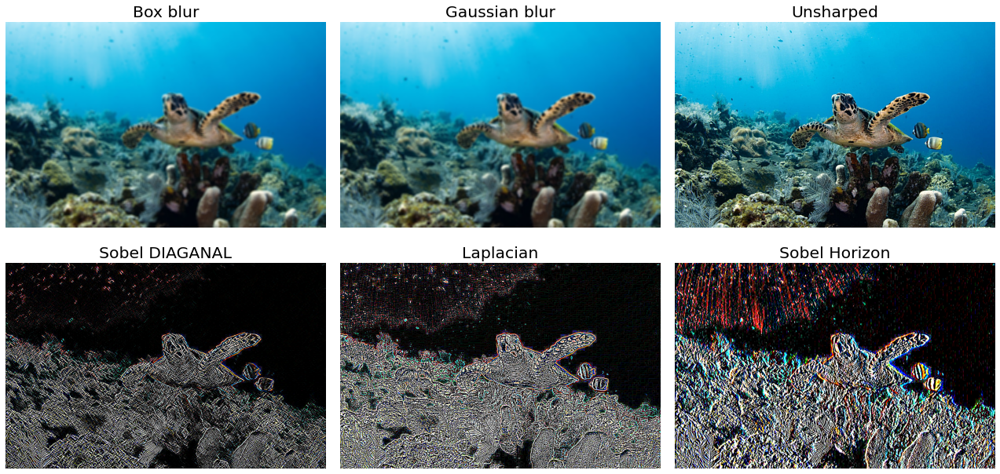

In [ ]:
image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(2,3, figsize=(18,9))

#1. BOX BLURRING
blurred = cv2.boxFilter(image, -1, (11,11))
axplot(blurred, axs[0,0], 'Box blur' )

#2. Gaussian BLURRING
blurred = cv2.GaussianBlur(image, (11, 11), 12.5)
axplot(blurred, axs[0,1], 'Gaussian blur' )

#3. Sobel Horizon
sobel_horizontal = cv2.Sobel(image, -1, 1, 0, ksize=5)
axplot(sobel_horizontal, axs[1,2], 'Sobel Horizon' )

# Sobel Vertical
# sobel_vertical = cv2.Sobel(image, -1, 0, 1, ksize=5)
# axplot(sobel_vertical, axs[1,1], 'Sobel Vertical' )

#4. Sobel DIAGANAL
sobel_diag = cv2.Sobel(image, -1, 1, 1, ksize=5)
axplot(sobel_diag, axs[1,0], 'Sobel DIAGANAL' )

#5. Laplacian
laplacian = cv2.Laplacian(image, -1,  ksize=5)
axplot(laplacian, axs[1,1], 'Laplacian' )

#6. Unsharped IMAGE
smoothed = cv2.GaussianBlur(image, (9, 9), 10)
unsharped = cv2.addWeighted(image, 1.5, smoothed, -0.5, 0)
axplot(unsharped, axs[0,2], 'Unsharped', finish=True  )



Также бибилотека позволяет проводить обработку при помощи некоторых нелинейных фильтров. Посмотрим на некоторые примеры.

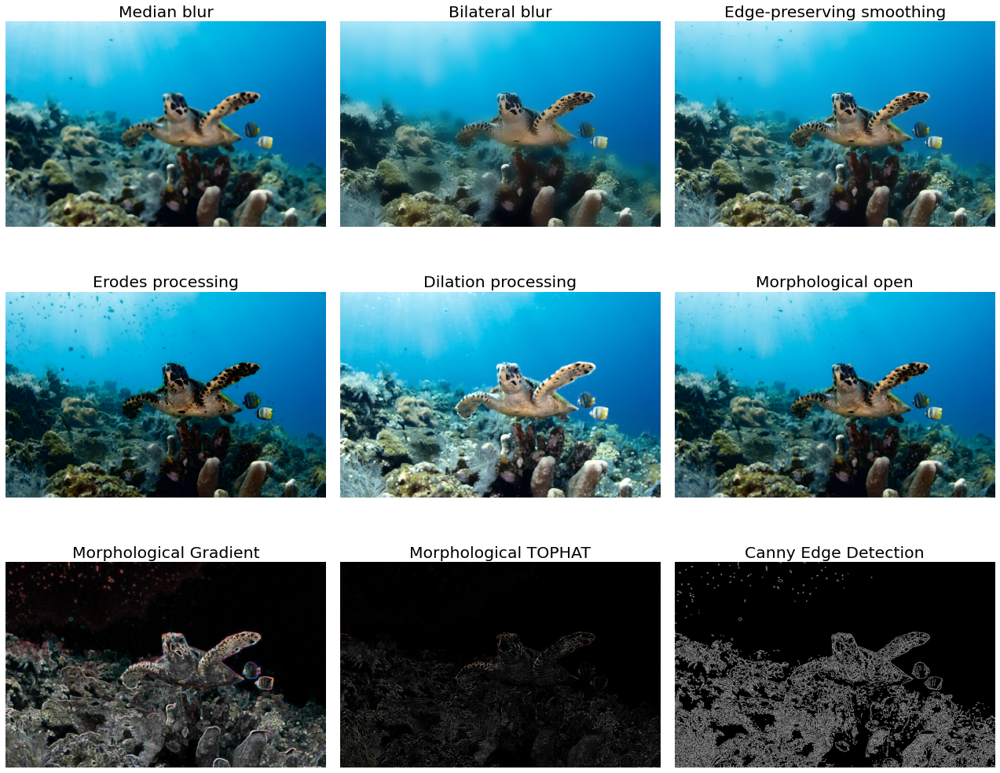

In [ ]:
image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(3,3, figsize=(18,15))

#1. Median BLURRING
blurred = cv2.medianBlur(image, 11)
axplot(blurred, axs[0,0], 'Median blur' )

#2. Bilateral BLURRING
bilateral  = cv2.bilateralFilter(image,50,125,125)
axplot(bilateral, axs[0,1], 'Bilateral blur' )

#3. Edge-preserving smoothing Filter
im_ = cv2.edgePreservingFilter(image, sigma_s=60, sigma_r=0.4)
axplot(im_, axs[0,2], 'Edge-preserving smoothing' )

#4. Erodes Filter using  structuring element
kernel = np.ones((5,5),dtype = np.uint8)
eroded = cv2.erode(image, kernel, iterations=1)
axplot(eroded, axs[1,0], 'Erodes processing' )

#5. Dilation Filter using  structuring element
kernel = np.ones((5,5),dtype = np.uint8)
dialtion = cv2.dilate(image, kernel, iterations=1)
axplot(dialtion, axs[1,1], 'Dilation processing' )

#6. MORPHOLOGICAL OPEN (Erodes then Dilation) # cv2.MORPH_CLOSE  Dilation followed by Erosion
kernel = np.ones((5,5),dtype = np.uint8)
im_ = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
axplot(im_, axs[1,2], 'Morphological open' )

#7. MORPHOLOGICAL GRADIENT (erosion - dilation) cv2.MORPH_OPEN (in reverse way)
kernel = np.ones((5,5), np.uint8)
im_ = cv2.morphologyEx(image, cv2.MORPH_GRADIENT, kernel)
axplot(im_, axs[2,0], 'Morphological Gradient' )

#8. MORPHOLOGICAL TOP HAT ( image - Opening(image)) # cv2.MORPH_BLACKHAT (in reverse way)
kernel = np.ones((5,5), np.uint8)
im_ = cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel)
axplot(im_, axs[2,1], 'Morphological TOPHAT' )

#9. Canny Edge Detection
canny  = cv2.Canny(image,125,175)
axplot(canny, axs[2,2], 'Canny Edge Detection', finish=True  )


Также покажем несколько более сложных техник работы с изображениями при помощи функционала `OpenCV`. Для начала посмотрим на некоторые приемы преобразования изображний.

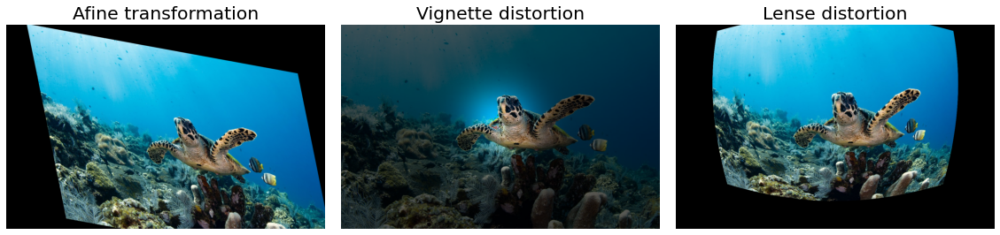

In [ ]:
# AFINE TRANSFORMS OF THE IMAGE
def afine_transform(image):
    w,h = image.shape[:2]
    srcTri = np.array( [[0,  0],
                        [w , 0],
                        [0,  h]])

    dstTri = np.array([[w*0.1,  h*0.0],
                       [w*0.95, h*0.1],
                       [w*0.4,  h*0.95]])

    warp_mat = cv2.getAffineTransform(srcTri.astype(np.float32), dstTri.astype(np.float32))
    warp_dst = cv2.warpAffine(image, warp_mat, (image.shape[1], image.shape[0]))
    return warp_dst
#-------------------------------------------------
def vignette(image, alpha =0.5, sigma = 100 ):
    h, w = image.shape[:2]

    # generating vignette mask using Gaussian
    x_kernel = cv2.getGaussianKernel(w,sigma)
    y_kernel = cv2.getGaussianKernel(h,sigma)

    #generating resultant_kernel matrix
    res_kernel = y_kernel * x_kernel.T

    #creating mask and normalising by using np.linalg
    mask = 255 * res_kernel / np.linalg.norm(res_kernel)
    output = [out_ch * (alpha+(1-alpha)*mask) for out_ch in cv2.split(image)]
    return  np.asarray(output).transpose((1,2,0)).astype(np.uint8)

#-------------------------------------------------
def lense_distorition(image, focal_length = 7, distCoeff = [6e-5, 2e-9, 2e-3, 1e-6 ] ):
    h, w = image.shape[:2]
    # assume matrix for camera
    cam = np.eye(3,dtype=np.float32)
    cam[0,2], cam[1,2] = w/2, h/2  # define center x
    cam[0,0], cam[1,1] = focal_length, focal_length # define focal length for x and y
    # here the undistortion will be computed
    dst = cv2.undistort(image,cam,np.asarray(distCoeff))
    return dst


image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(1,3, figsize=(16,4))

axplot(afine_transform(image),   axs[0], 'Afine transformation' )
axplot(vignette(image,0.35),     axs[1], 'Vignette distortion' )
axplot(lense_distorition(image), axs[2], 'Lense distortion', finish=True  )


Также посмотрим некоторые приемы стилизации изображений.

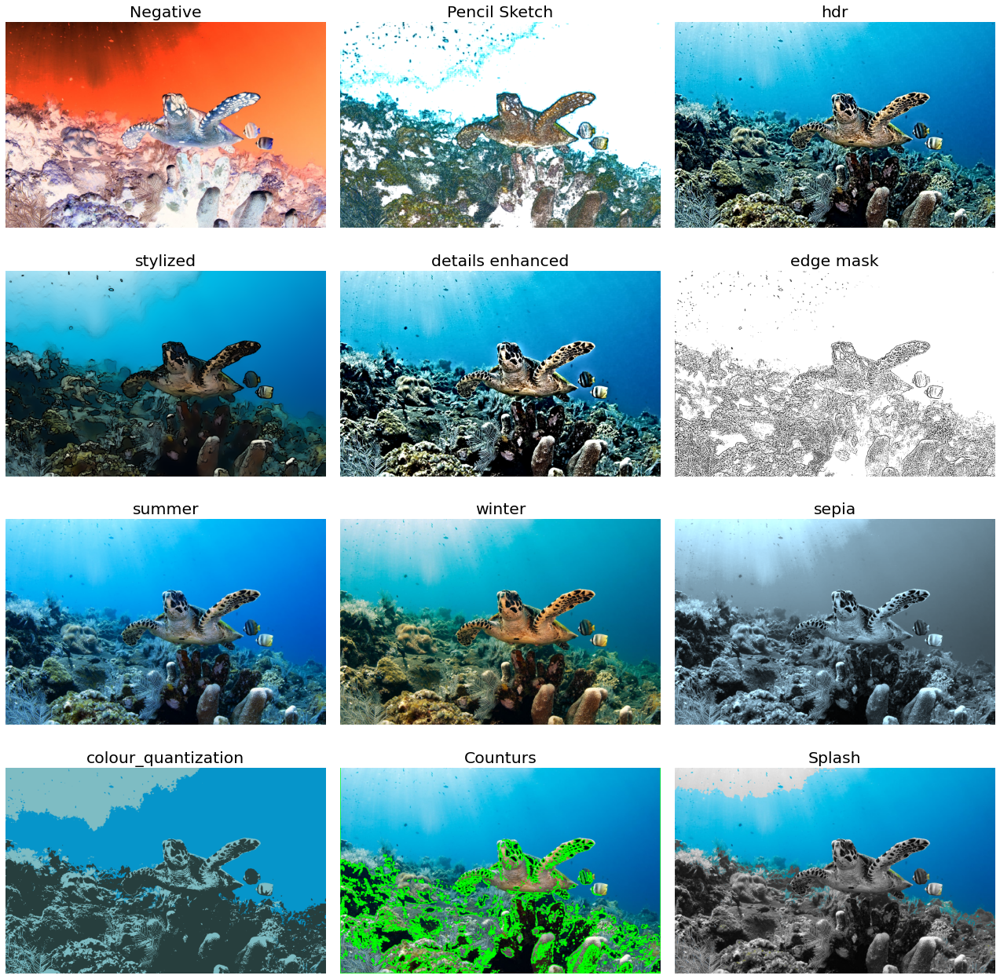

In [ ]:
from scipy.interpolate import UnivariateSpline

#-------------------------------------------------
def counturs(image, threshold = 50, color = (0,255,0), thickness=2 ):
    im_ = np.copy(image )
    im_gray = cv2.cvtColor(im_,cv2.COLOR_BGR2GRAY)
    _,thresh = cv2.threshold(im_gray,threshold,255,cv2.THRESH_BINARY)
#     thresh = cv2.Canny(im_gray, threshold, 255)
    contours, _ = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    im_ =  cv2.drawContours(im_,contours,-1,color,thickness = thickness)
    return im_

#-------------------------------------------------
def LookupTable(x, y):
    spline = UnivariateSpline(x, y)
    return spline(range(256))

def summer(img):
    # summer
    increaseLookupTable = LookupTable([0, 64, 128, 256],
                                      [0, 80, 160, 256])
    decreaseLookupTable = LookupTable([0, 64, 128, 256],
                                      [0, 50, 100, 256])
    blue_channel, green_channel,red_channel  = cv2.split(img)
    red_channel  = cv2.LUT(red_channel,  increaseLookupTable).astype(np.uint8)
    blue_channel = cv2.LUT(blue_channel, decreaseLookupTable).astype(np.uint8)
    summer_ = cv2.merge((blue_channel, green_channel, red_channel ))
    return summer_
#-------------------------------------------
def winter(img):
    increaseLookupTable = LookupTable([0, 64, 128, 256], [0, 80, 160, 256])
    decreaseLookupTable = LookupTable([0, 64, 128, 256], [0, 50, 100, 256])
    blue_channel, green_channel,red_channel = cv2.split(img)
    red_channel  = cv2.LUT(red_channel, decreaseLookupTable).astype(np.uint8)
    blue_channel = cv2.LUT(blue_channel, increaseLookupTable).astype(np.uint8)

    out= cv2.merge((blue_channel, green_channel, red_channel))
    return out

#-------------------------------------------------
def sepia(img):
    img_sepia = np.array(img, dtype=np.float64)
    # multipying image with special sepia matrix
    img_sepia = cv2.transform(img_sepia,
                              np.matrix([[0.272, 0.534, 0.131],
                                         [0.349, 0.686, 0.168],
                                         [0.393, 0.769, 0.189]]))
    return np.clip(img_sepia,0,255).astype(np.uint8)
#-------------------------------------------
def edge_mask(img, line_size=3, blur_value=3):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.medianBlur(gray, blur_value)
    edges = cv2.adaptiveThreshold(gray_blur, 255,
                                  cv2.ADAPTIVE_THRESH_MEAN_C,
                                  cv2.THRESH_BINARY,
                                  line_size,
                                  blur_value)
    return edges
#-------------------------------------------
def сolour_quantization(image,k=3):
    im_ = image.reshape((-1, 3))
    im_ = np.float32(im_)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,
                100, 0.001)
    compactness, label, center = cv2.kmeans(im_, k, None,
                                            criteria, 1,
                                            cv2.KMEANS_RANDOM_CENTERS)
    center = np.uint8(center)
    res = center[label.flatten()]
    res2 = res.reshape((image.shape))
    return res2
#---------------------------------------------------------
def splash(image, l, u ):

    def hsv(image, l, u):
        hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        lower = np.array([l,128,128]) # setting lower HSV value
        upper = np.array([u,255,255]) # setting upper HSV value
        mask = cv2.inRange(hsv, lower, upper) # generating mask
        return mask

    image_ = image.copy()
    res  = np.zeros_like(image)
    gray = cv2.cvtColor(image_, cv2.COLOR_BGR2GRAY)

    mask = hsv(image_, l, u)
    inv_mask = cv2.bitwise_not(mask)

    color_regions = cv2.bitwise_and(image_, image_, mask= mask) # regions in color
    gray_regions  = cv2.bitwise_and(gray, gray, mask= inv_mask) # regionsin gray

    res = cv2.merge((gray_regions,gray_regions,gray_regions)) # storing grayscale mask to all three slices

    res = cv2.bitwise_or(color_regions, res) # joining grayscale and color region

    return res

image = cv2.imread("image.png",cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(4,3, figsize=(18,18))

inverse = cv2.bitwise_not(image)
axplot(inverse, axs[0,0], 'Negative' )

sk_gray, sk_color = cv2.pencilSketch(image, sigma_s=6, sigma_r=0.07, shade_factor=0.1)
axplot(sk_color, axs[0,1], 'Pencil Sketch' )

hdr = cv2.detailEnhance(image, sigma_s=12, sigma_r=0.15)
axplot(hdr, axs[0,2], 'hdr' )

im_ = cv2.stylization (image,   sigma_s = 20, sigma_r = 0.6)
axplot(im_, axs[1,0], 'stylized' )

im_ = cv2.detailEnhance (image, sigma_s = 20, sigma_r = 0.5)
axplot(im_, axs[1,1], 'details enhanced' )

axplot(edge_mask(image), axs[1,2], 'edge mask' )

axplot(summer(image), axs[2,0], 'summer' )
axplot(winter(image), axs[2,1], 'winter' )
axplot(sepia(image), axs[2,2], 'sepia' )

axplot(сolour_quantization(image), axs[3,0], 'сolour_quantization' )
axplot(counturs(image), axs[3,1], 'Counturs' )

low_hue, high_hue = 30,120 # the range of Hue
axplot(splash(image, low_hue, high_hue), axs[3,2], 'Splash', finish=True  )
